## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.



## Import Libraries

In [1]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import pickle
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
from random import randint
import datetime
import time

%matplotlib inline




## Camera Calibration

In [2]:
#prepare points
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
calibrated_images = []
failed_calibrated_images = []
image_names = []
failed_image_names = []

# Calibration images
chess_images = glob.glob('./camera_cal/calibration*.jpg')


# Search for corners
for i,fname in enumerate(chess_images):
 
    chess_img = cv2.imread(fname)
    gray = cv2.cvtColor(chess_img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        chess_img = cv2.drawChessboardCorners(chess_img, (9,6), corners, ret)
        calibrated_images.append(chess_img)
        image_names.append(fname) # Keep name of images
    else:
        failed_calibrated_images.append(chess_img)
        failed_image_names.append(fname)

print("Detect Corners: ", len(calibrated_images))  
print("Failed: ", len(failed_calibrated_images))  


Detect Corners:  17
Failed:  3


### Visualize Detected Corners of Calibration Images

Corners detected:


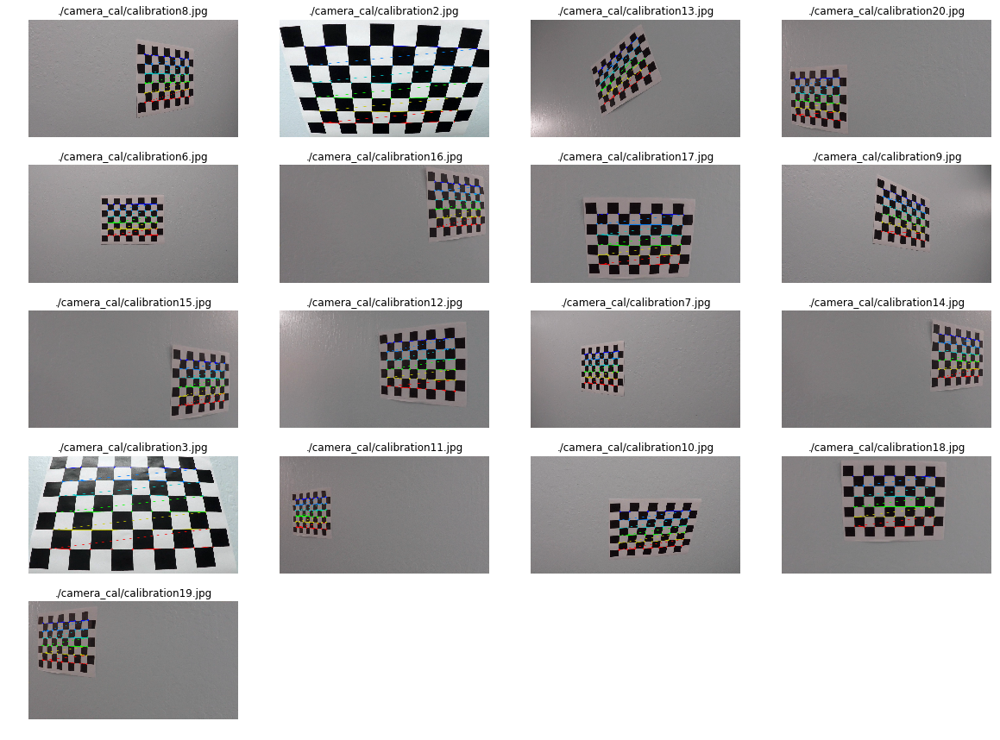

Unable the Corner Detect:


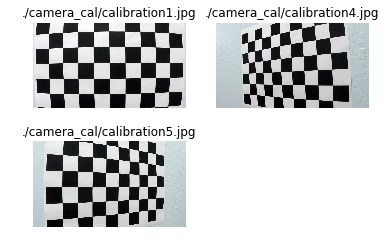

In [3]:
plt.figure(figsize=(20, 15))
gridspec.GridSpec(5, 4)

print('Corners detected:')
# Loop through the images and look for the chessboard corners
for i, image, in enumerate(calibrated_images):
    plt.subplot2grid((5, 4), (i//4, i%4), colspan=1, rowspan=1)
    plt.imshow(image)
    plt.title(image_names[i])
    plt.axis('off')
plt.show()

print('Unable the Corner Detect:')
for i, image, in enumerate(failed_calibrated_images):
    plt.subplot2grid((2, 2),(i//2,i%2) ,colspan=1, rowspan=1)
    plt.imshow(image)
    plt.title(failed_image_names[i])
    plt.axis('off')
plt.show()


### Calculate Calibration Parameters

Text(0.5,1,'Undistorted Image')

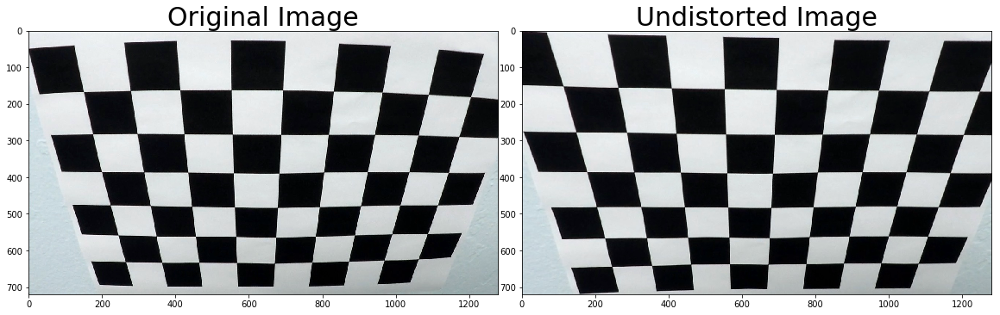

In [4]:
# Test undistord on an chessboard
img_cal = cv2.imread('./camera_cal/calibration2.jpg')



gray = cv2.cvtColor(img_cal,cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, 
                                                   imgpoints, 
                                                   gray.shape[::-1], 
                                                   None, None)

undist = cv2.undistort(img_cal, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img_cal)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)


### Save data for future use

In [6]:
import pickle
pickle.dump( { 'mtx': mtx, 'dist': dist },
            open('./pickled_data/camera_calibration.p', 'wb'))

### Undistord Images

In [7]:
def undistorting(img, mtx=mtx, dist=dist):
    """
    Undistort the image with `mtx`, `dist` 
    """
    return cv2.undistort(img, mtx, dist, None, mtx)

### HLS Conversion

In [8]:
def convertHLS(img):
    """
    Convert image to HLS Color Space
    """
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

### Import test images to list

In [9]:
images_test = glob.glob('test_images/*.jpg') # Reading Images from test_images folder
print("Number of Test Images= ", len(images_test))


Number of Test Images=  8


### Test Undistord on Test Images

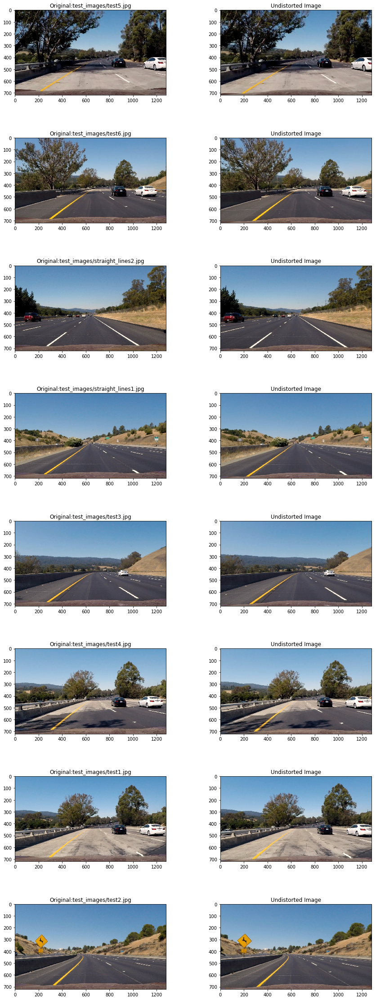

In [10]:
#Plot Images
f, axes= plt.subplots(8,2,figsize=(15,40))
f.subplots_adjust(hspace=0.5)

for index, image in enumerate(images_test):
    originalImage= cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)#Otherwise image look like in negative form
    undistorted_img=undistorting(originalImage) # undistorting image 
    
    axes[index,0].imshow(originalImage)
    axes[index,0].set_title("Original:{}".format(images_test[index]))
    
    axes[index,1].set_title("Undistorted Image")
    axes[index,1].imshow(undistorted_img)
    

### Image Warp

In [11]:
img_for_shape= cv2.imread(images_test[0])
height = img_for_shape.shape[0]
width = img_for_shape.shape[1]

#Found this calculation in Github. One of student tuned
#these parameters
left=[100,720] #left bottom most
right=[1180,720] #right bottom 
apex_left=[590,450] # left top
apex_right=[690,450] # right top 

d_left=[200,720] #left bottom most
d_apex_left=[200,0] # left top
d_apex_right=[1050,0] # right top 
d_right=[1080,720] #right bottom 

src=np.float32([left,apex_left,apex_right,right])
dst=np.float32([d_left,d_apex_left,d_apex_right,d_right])

#Warping Image
def warper(img,src=src,dst=dst,height=height,width=width):
    
    """
    This function performs image warping. 
    Take image as input and give warped image as output
    """
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    # keep same size as input image
    warped = cv2.warpPerspective(img, M, (width,height))  
    return warped, M, Minv


#Drawing ROI
def ROI(img):
    cv2.polylines(img, np.int32(np.array([[left, apex_left, apex_right, right]])),
                         True,(0,0,255),10)
   
    
    cv2.circle(img,(200,720), 60, (0,0,255), -1)
    cv2.circle(img,(200,0), 60, (0,255,), -1)
    cv2.circle(img,(1080,0), 60, (255,0,0), -1)
    cv2.circle(img,(1080,720), 60, (0,0,0), -1)

    return img
print("Done")

Done


### Test  Warping 

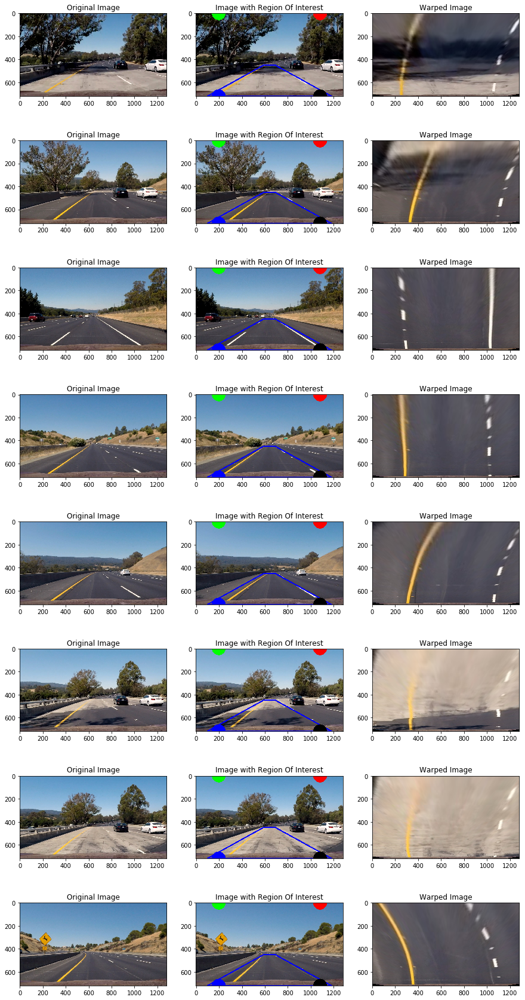

In [12]:
# Testing ROI and Wrap on Test Images

f, axes= plt.subplots(8,3,figsize=(15,30))
f.subplots_adjust(hspace=0.5)


for index, image in enumerate(images_test):
    img_org= cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    img_cp= img_org.copy()
    warped, M, Minv = warper(img_cp)
    
    axes[index,0].imshow(img_org)
    axes[index,0].set_title("Original Image")    
    
    axes[index,1].imshow(ROI(img_org))
    axes[index,1].set_title("Image with Region Of Interest")    
    
    
    axes[index,2].imshow(warped)
    axes[index,2].set_title("Warped Image")

### Sobel Absolute Threshold

In [13]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel(img, orient='x',sx_thresh=(25, 255)):
    img = np.copy(img)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F,  orient=='x', orient=='y') # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
   
    return sxbinary

Text(0.5,1,'Sobel Y Image')

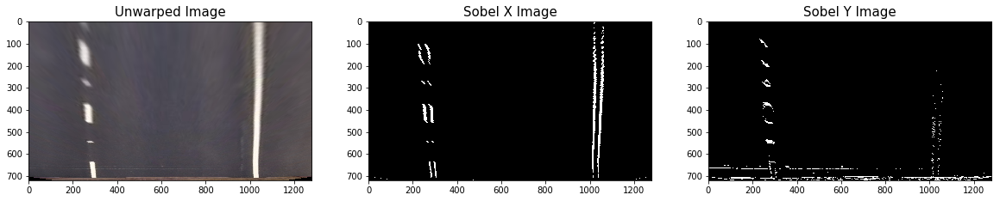

In [14]:
img_tst = mpimg.imread(images_test[2])


warped_image, M, Minv = warper(img_tst)

sobel_img_y    = abs_sobel(warped_image,orient='y',sx_thresh=(15, 255))
sobel_img_x    = abs_sobel(warped_image,orient='x',sx_thresh=(25,200))

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 15))

ax1.imshow(warped_image)
ax1.set_title('Unwarped Image', fontsize=15)

ax2.imshow(sobel_img_x, cmap='gray')
ax2.set_title('Sobel X Image', fontsize=15)

ax3.imshow(sobel_img_y, cmap='gray')
ax3.set_title('Sobel Y Image', fontsize=15)

### Sobel Magnitude Threshold

In [15]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def magnitude_sobel(img, ksize=7, mag_thresh=(15, 255)):
    img = np.copy(img)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0,ksize=ksize) # Take the derivative in x
    # Sobel y
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1,ksize=ksize) # Take the derivative in y
    #Magnitude
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    #Scale to 8-bit
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    #Binary Mask
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    binary_output = np.copy(sxbinary) 
    return binary_output

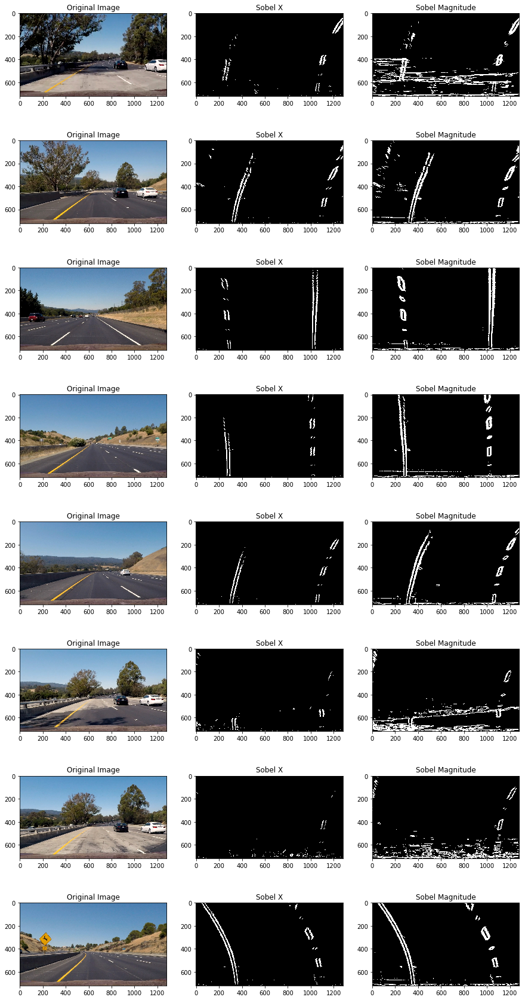

In [16]:
# Testing Sobel X and Sobel Magnitude on Test Images

f, axes= plt.subplots(8,3,figsize=(15,30))
f.subplots_adjust(hspace=0.5)




for index, image in enumerate(images_test):
    img_org= cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    img_cp= img_org.copy()

    warped_image, M, Minv = warper(img_cp)
    axes[index,0].imshow(img_org)
    axes[index,0].set_title("Original Image")    
    
    
    axes[index,1].imshow(abs_sobel(warped_image,orient='x'),cmap="gray")
    axes[index,1].set_title("Sobel X")    
    
    axes[index,2].imshow(magnitude_sobel(warped_image, ksize=7, mag_thresh=(15, 200)),cmap="gray")
    axes[index,2].set_title("Sobel Magnitude")

### Sobel Direction Threshold


In [17]:
def dir_thresh(img, ksize=7, dir_thresh=(0, 0.09)):
    img = np.copy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=ksize) # Take the derivative in x
    # Sobel y
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=ksize) # Take the derivative in y
    #Absolute
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    #Magnitude
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    #Binary Mask
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= dir_thresh[0]) & (grad_dir <= dir_thresh[1])] = 1
   
    return binary_output
print('Done')

Done


Text(0.5,1,'Dir Image')

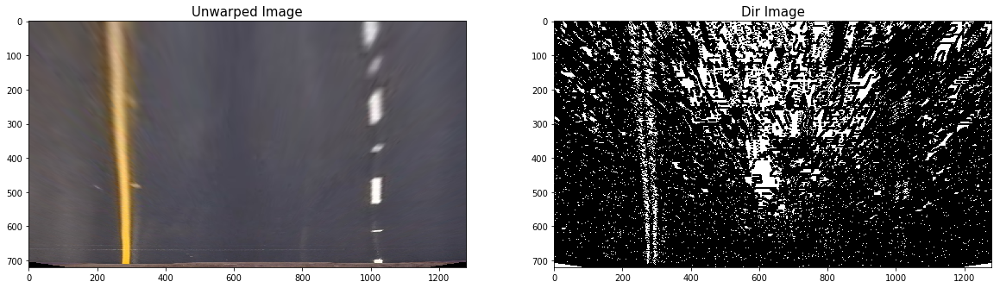

In [18]:
img_tst = mpimg.imread(images_test[3])


warped_image, M, Minv = warper(img_tst)
sobel_dir_img  = dir_thresh(warped_image)



# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

ax1.imshow(warped_image)
ax1.set_title('Unwarped Image', fontsize=15)

ax2.imshow(sobel_dir_img, cmap='gray')
ax2.set_title('Dir Image', fontsize=15)



### HLS L&S Channels Extraction  

In [19]:
def HLSchannelExtraction(img, colorchannel, l_thresh=(100, 255), s_thresh=(125, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    if(colorchannel=='s_channel'):
        binary_output = np.zeros_like(hls[:,:,2])
        binary_output[(hls[:,:,2] > s_thresh[0]) & (hls[:,:,2] <= s_thresh[1])] = 1
    
    if(colorchannel=='l_channel'):
        hls_l = hls[:,:,1]
        hls_l = hls_l*(255/np.max(hls_l))
        binary_output = np.zeros_like(hls_l)
        binary_output[(hls_l > s_thresh[0]) & (hls_l <= s_thresh[1])] = 1
        
    return binary_output
print('Done')

Done


### HSV S Channel Extraction

In [20]:
def hsv_channel_thresh(img, hsv_thresh=(100, 255)):
    # Convert to HLS color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # S channel
    hsv_s = hsv[:,:,1]
    binary_s = np.zeros_like(hsv_s)
    binary_s[(hsv_s > hsv_thresh[0]) & (hsv_s <= hsv_thresh[1])] = 1

    return binary_s
print('Done')

Done


### LAB B Channel Extraction

In [21]:
def lab_bthresh(img, thresh=(190,255)):
    # Convert
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1

    return binary_output
print('Done')

Done


In [22]:
def udacity_hsl_threshold(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)

   
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
   
    combined = np.zeros_like(s_binary)
    combined[((s_binary == 1) | (sxbinary == 1)) ] = 1
    return combined
print('Done')

Done


In [23]:
def inrangeWhite(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # define range of blue color in HSV
    
    
    lower_white = np.array([0,0,230])
    upper_white = np.array([120,160,255])
    
    mask = cv2.inRange(hsv, lower_white, upper_white)
    res = cv2.bitwise_and(img,img, mask= mask)
    gray_res = cv2.cvtColor(res,cv2.COLOR_RGB2GRAY)
    (thresh, im_bw) = cv2.threshold(gray_res, 100, 255, cv2.THRESH_BINARY)  
    return im_bw

print('Done') 

Done


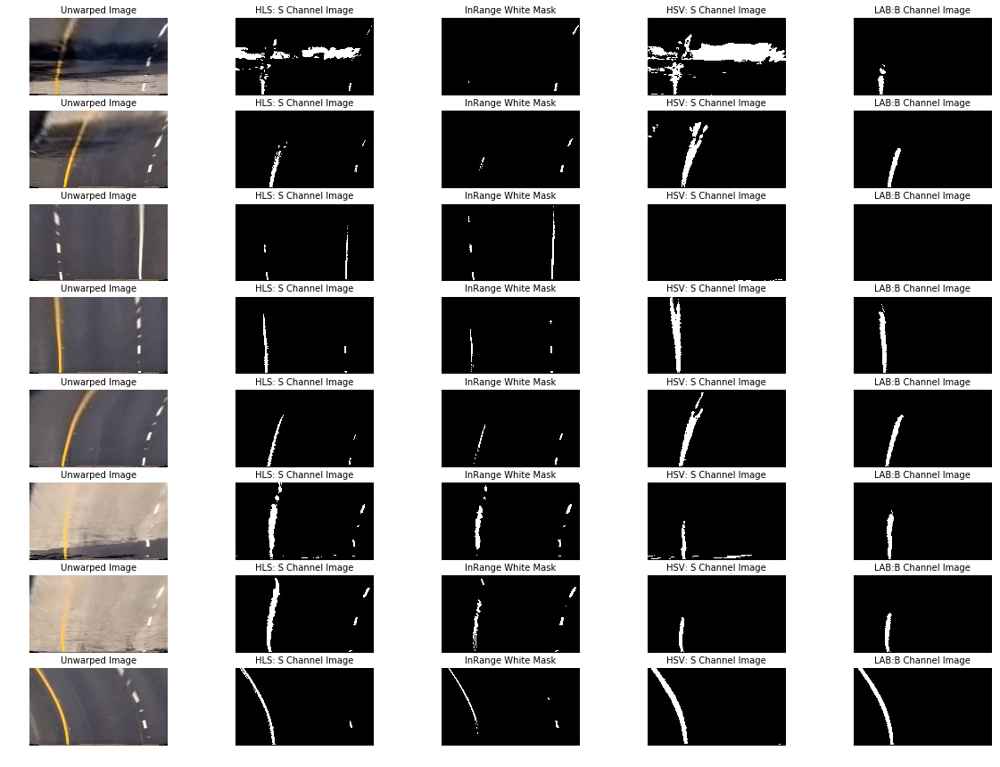

In [24]:

fig, axs = plt.subplots(len(images_test),5, figsize=(20, 15))
axs = axs.ravel()
i = 0
for image in images_test:
    img_tst = mpimg.imread(image)
    warped_image, M, Minv = warper(img_tst)

    l_img       =  HLSchannelExtraction(warped_image,colorchannel="l_channel", l_thresh=(250, 255))
    s_img       =  HLSchannelExtraction(warped_image,colorchannel="s_channel", s_thresh=(125, 255))
    hsv_s_img   =  hsv_channel_thresh(warped_image, hsv_thresh=(100, 220))
    labbchannel =  lab_bthresh(warped_image, thresh=(190,255))
    whitemask   = inrangeWhite(warped_image)
    axs[i].imshow(warped_image)
    axs[i].axis('off')
    axs[i].set_title('Unwarped Image', fontsize=10)
    i += 1
    axs[i].imshow(s_img,cmap='gray')
    axs[i].axis('off')
    axs[i].set_title('HLS: S Channel Image', fontsize=10)
    i += 1
    axs[i].imshow(whitemask, cmap='gray')
    axs[i].axis('off')
    axs[i].set_title('InRange White Mask', fontsize=10)
    i += 1
    
    axs[i].imshow(hsv_s_img, cmap='gray')
    axs[i].axis('off')
    axs[i].set_title('HSV: S Channel Image', fontsize=10)
    i += 1
    
    axs[i].imshow(labbchannel, cmap='gray')
    axs[i].axis('off')
    axs[i].set_title('LAB:B Channel Image', fontsize=10)
    i += 1

## Test Birdview Pipeline on  Test Images

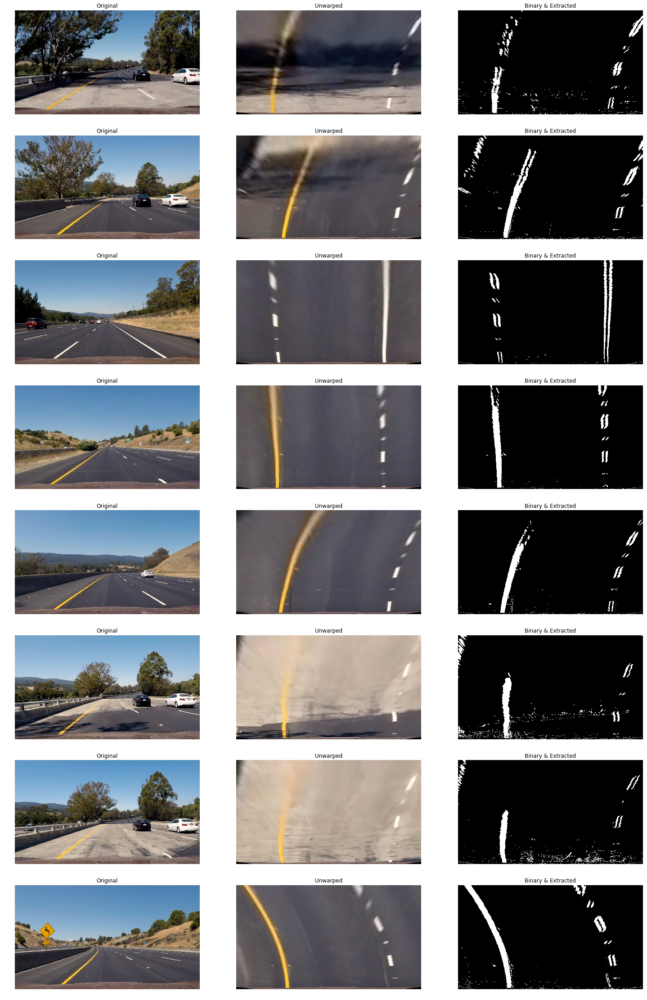

In [25]:

def birdview(img):
    
    # Undistort
    img_undist       =  undistorting(img)
    
    # Unwarp
    img_unwarped, M, Minv = warper(img)

    # Sobel X
    img_abs_sobel_x  =  abs_sobel(img_unwarped, orient='x',sx_thresh=(15, 200))
    
    # Sobel Y
    #img_abs_sobel_y  =  abs_sobel(img_unwarped, orient='y',sx_thresh=(25, 255))
    
    # Sobel Magnitude
    #img_mag          =  magnitude_sobel(img_unwarped, ksize=7,mag_thresh=(15, 200))
    
    # Sobel Direction
    #img_dir          =  dir_thresh(img_unwarped, ksize=7, dir_thresh=(0.01, 0.09))
    
    # HLS: L&S Channel 
    l_img            =  HLSchannelExtraction(img_unwarped,"l_channel", l_thresh=(100, 255))
    s_img            =  HLSchannelExtraction(img_unwarped,"s_channel", s_thresh=(90, 255))
    
    # HSV: S Channel 
    #hsv_s_img        =  hsv_channel_thresh(img_unwarped, hsv_thresh=(100, 255))
    
    # LAB: B Channel 
    labbchannel =  lab_bthresh(img_unwarped, thresh=(190,255))
    # In Range White
    whitemask   = inrangeWhite(warped_image)
    
    # Combine All
    combined = np.zeros_like(l_img)
    combined[((((s_img == 1) & (l_img == 1) & (labbchannel==1)) 
             | (img_abs_sobel_x == 1)) 
             | (whitemask == 1 ))] = 1
    return combined, img_unwarped, M, Minv 
 
# Set up plot
fig, axs = plt.subplots(len(images_test),3, figsize=(25, 40))
axs = axs.ravel()
i = 0
warped_lane_images = []
for image in images_test:
    img = mpimg.imread(image)
    img_combined, unwarped_img, M, Minv  = birdview(img)
    warped_lane_images.append(img_combined)   
    
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title("Original")
    i += 1
    axs[i].imshow(unwarped_img)
    axs[i].set_title("Unwarped")
    axs[i].axis('off')
    i += 1
    axs[i].imshow(img_combined, cmap='gray')
    axs[i].set_title("Binary & Extracted")
    axs[i].axis('off')
    i += 1    

### Histogram 


In [26]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]
    #Histogram calculation
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram
print("Done")

Done


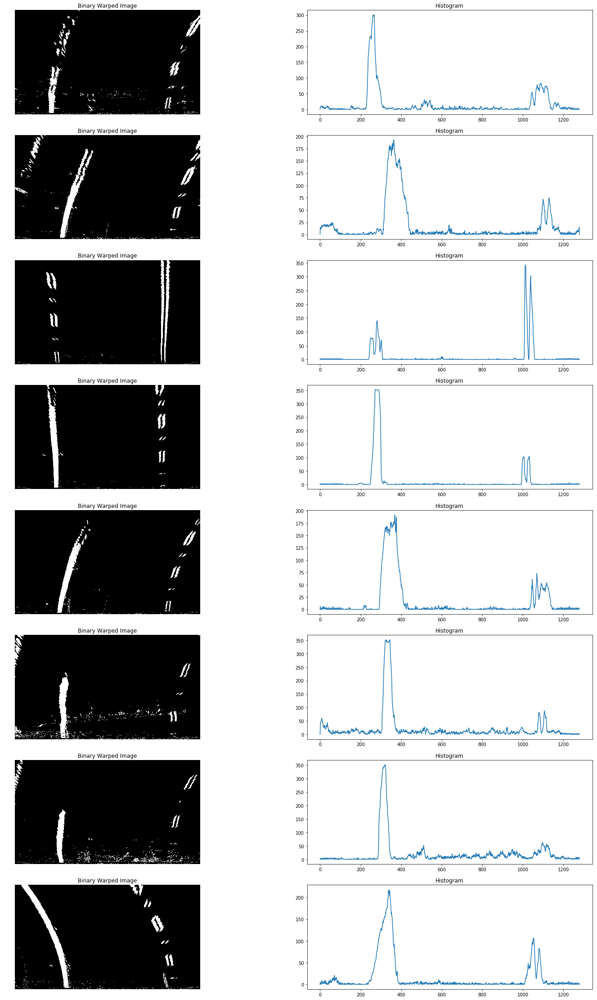

In [27]:
fig, axs = plt.subplots(len(warped_lane_images),2, figsize=(25, 40))
axs = axs.ravel()
i = 0
for image in warped_lane_images:
    hist_img = hist(image)
       
    
    axs[i].imshow(image,cmap="gray")
    axs[i].set_title("Binary Warped Image")
    axs[i].axis('off')
    i += 1
    
    axs[i].plot(hist_img)
    axs[i].set_title("Histogram")
    i += 1   

### Sliding Windows

> Using Udacity lessons code

In [28]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped,Draw=True):
    img_cp = np.copy(binary_warped)
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(img_cp)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_cp.shape[0]-1, img_cp.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Plots the left and right polynomials on the lane lines
    if(Draw):
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit



[  3.57316148e-04  -4.86631082e-01   4.19128798e+02]
[  6.07595905e-04  -7.59024507e-01   1.31359092e+03]


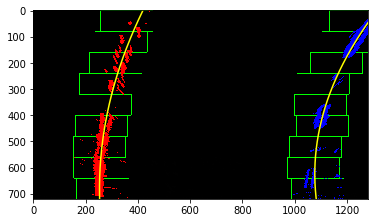

In [29]:
image = warped_lane_images[0]
image = np.array(image,np.uint8)
out_img,left_fit,right_fit = fit_polynomial(image,Draw=True)
plt.imshow(out_img)
print(left_fit)
print(right_fit)

### Search From Prior Polyfit

In [30]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### Fit a second order polynomial to each with np.polyfit()
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### Calc both polynomials using ploty, left_fit and right_fit 
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit,Draw=True):
    img = np.copy(binary_warped)
    # HYPERPARAMETER
    margin = 100

    # Grab activated pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(img.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((img, img, img))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    if(Draw):
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')    
    return result



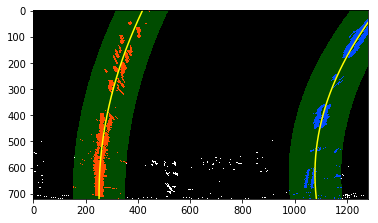

In [31]:
image = warped_lane_images[0]
image = np.array(image,np.uint8)

out_img, left_fit, right_fit = fit_polynomial(image,Draw=False)
result = search_around_poly(image,left_fit,right_fit,Draw=True)

plt.imshow(result)

### Calculate Real World Radius Curve

In [32]:
def measure_curvature_real(img,left_fit,right_fit):
  
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    img_shape_h = img[0]
    
    ploty = np.linspace(0, img.shape[0]-1, warped.shape[0])
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    positionCar= img.shape[1]/2
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    y_eval=np.max(ploty)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    actualPosition= (left_lane_bottom+ right_lane_bottom)/2
    
    distance= (positionCar - actualPosition)* xm_per_pix
    curverad = (left_curverad + right_curverad)/2
    return left_curverad,right_curverad, distance,curverad
   
print("Done")

Done


Left Curve: 459.62002618542544 | Right Curve: 270.37523011106555
Distance:  -1.19898590173
Curve:  364.997628148


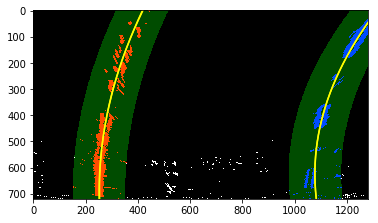

In [33]:
image = warped_lane_images[0]
image = np.array(image,np.uint8)
out_img, left_fit, right_fit = fit_polynomial(image)
result = search_around_poly(image,left_fit,right_fit)
plt.imshow(result)
left_curverad, right_curverad, distance, curverad = measure_curvature_real(img,left_fit,right_fit)
print("Left Curve: {} | Right Curve: {}".format(left_curverad,right_curverad))
print("Distance: ", distance)
print("Curve: ",curverad)


### Draw the Detected Area on Original Image

In [34]:
def draw_lane(img, warped, l_fit, r_fit, Minv):
    new_img = np.copy(img)
    if l_fit is None or r_fit is None:
        return img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    height = warped.shape[0]
    width = warped.shape[1]
    ploty = np.linspace(0, height-1, num=height)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (width, height)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

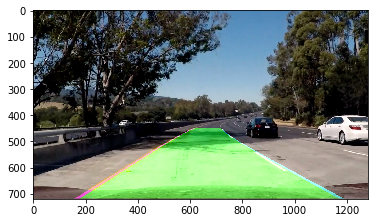

In [35]:
warped = warped_lane_images[0]
image= cv2.cvtColor(cv2.imread(images_test[0]),cv2.COLOR_BGR2RGB)
image = np.array(image,np.uint8)
warped = np.array(warped,np.uint8)

#Polynomial Search / Sliding Window
out_img, left_fit, right_fit = fit_polynomial(warped,Draw=False)

#Search From Prior
result = search_around_poly(warped,left_fit,right_fit,Draw=False)

#Draw original image
final = draw_lane(image, warped, left_fit, right_fit, Minv)
plt.imshow(final)

In [36]:
def draw_data(img, curv_rad, center_dist):
    new_img = np.copy(img)
    h = new_img.shape[0]
    
    font = cv2.FONT_HERSHEY_TRIPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (144,238,144), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5,  (144,238,144), 2, cv2.LINE_AA)
    
    cv2.rectangle(new_img, (10,20), (710,140), (255,255,255), 5) 

    
    return new_img


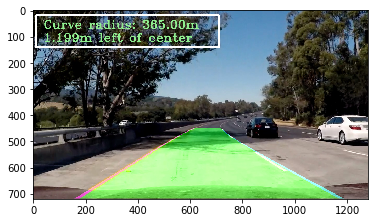

In [37]:
data_final = draw_data(final, curverad, distance)
plt.imshow(data_final)

## Complete Pipeline

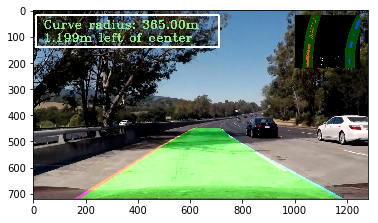

In [47]:
def process_image(img,save=False):
    orginal_img = np.copy(img)
    img_combined, unwarped_img, M, Minv  = birdview(img)
    warped = np.array(img_combined,np.uint8)
    # Polynomial Search / Sliding Window
    out_img, left_fit, right_fit = fit_polynomial(warped,Draw=False)
    
    #Search From Prior
    result = search_around_poly(warped,left_fit,right_fit,Draw=False)
    
    #Calculate curvatures
    left_curverad, right_curverad, distance, curverad = measure_curvature_real(img,left_fit,right_fit)

    #Draw on original image
    final = draw_lane(img, warped, left_fit, right_fit, Minv)
    
    #Writing data on image
    data_final = draw_data(final, curverad, distance)
    
    ts = time.time()
    st = datetime.datetime.fromtimestamp(ts).strftime('%Y%m%d %H%M%S')
    if(save):
        plt.imsave('./output_images/'+str(st)+'.jpg',orginal_img)
        plt.imsave('./output_images/'+str(st)+'_o.jpg',data_final)
    newCombinedImage= np.dstack((img_combined*255,img_combined*255,img_combined*255))
    data_final[20:220,1000:1250, :]= cv2.resize(result, (250,200))
    return data_final


image= cv2.cvtColor(cv2.imread(images_test[0]),cv2.COLOR_BGR2RGB)

show_img = process_image(image)
plt.imshow(show_img)

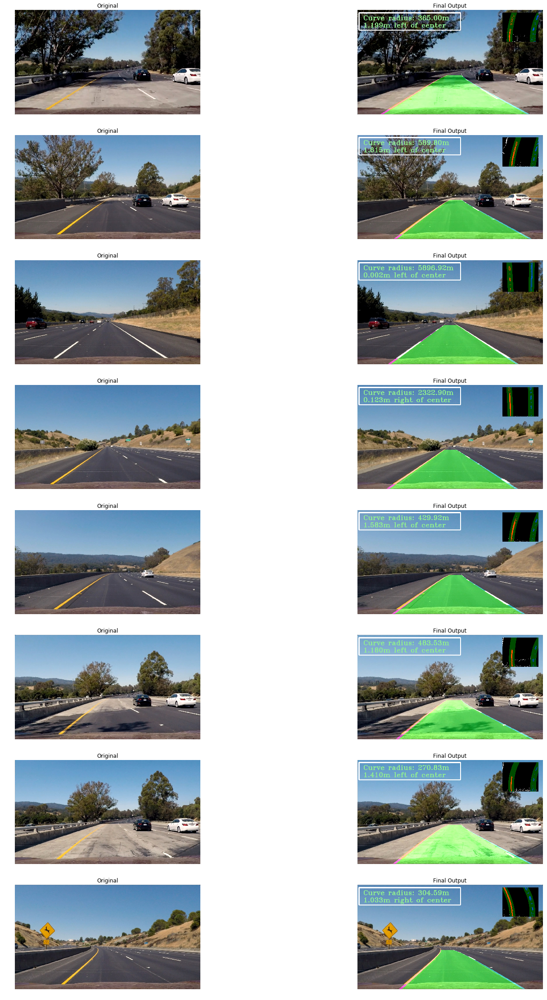

In [49]:
fig, axs = plt.subplots(len(images_test),2, figsize=(25, 40))
axs = axs.ravel()
i = 0
warped_lane_images = []
for image in images_test:
    img = mpimg.imread(image)
    son = process_image(img,save=True)
    
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title("Original")
    i += 1
    axs[i].imshow(son)
    axs[i].set_title("Final Output")
    axs[i].axis('off')
    i += 1
   

## Running Pipeline On Video

In [51]:
import moviepy
from moviepy.editor import VideoFileClip
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



100%|█████████▉| 1260/1261 [05:24<00:00,  3.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 3min 22s, sys: 3.39 s, total: 3min 25s
Wall time: 5min 27s


In [ ]:
import moviepy
from moviepy.editor import VideoFileClip
video_output1 = 'challenge_video_output.mp4'
video_input1 = VideoFileClip('challenge_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


 84%|████████▎ | 405/485 [01:38<00:20,  3.98it/s]

In [52]:
import moviepy
from moviepy.editor import VideoFileClip
video_output1 = 'harder_challenge_video_output.mp4'
video_input1 = VideoFileClip('harder_challenge_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [05:44<00:00,  3.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 3min 13s, sys: 3.2 s, total: 3min 16s
Wall time: 5min 48s
